 Environment Setup and Library Imports:

In [1]:
import numpy as np
import pandas as pd
import gc
import keras
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from skimage.transform import resize
import tensorflow as tf
import keras.backend as K
from keras.losses import binary_crossentropy
from keras.callbacks import ModelCheckpoint
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout, BatchNormalization
from keras import optimizers
from PIL import Image
import os
import random
import glob
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit  # Replace StratifiedKFold with StratifiedShuffleSplit


# Set the seed for reproducibility
seed = 42
np.random.seed(seed)
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

# Visualization Settings
# plt.style.use('seaborn-white') # This style is deprecated in newer Matplotlib versions.
plt.style.use('seaborn-white') # Use the updated style name.
sns.set_style("white") # This line remains unchanged.

Data Loading

In [2]:
mask_train_path = 'C:/Users/113323406/Downloads/kaggle_dataset/kaggle_dataset/keras_mask_train/masks'
mask_val_path = 'C:/Users/113323406/Downloads/kaggle_dataset/kaggle_dataset/keras_mask_val/masks'
im_train_path = 'C:/Users/113323406/Downloads/kaggle_dataset/kaggle_dataset/keras_im_train/train'
im_val_path = 'C:/Users/113323406/Downloads/kaggle_dataset/kaggle_dataset/keras_im_val/train'

# Load all training and validation images and masks
all_train_images = glob.glob(os.path.join(im_train_path, '*'))
all_train_masks = glob.glob(os.path.join(mask_train_path, '*'))
all_val_images = glob.glob(os.path.join(im_val_path, '*'))
all_val_masks = glob.glob(os.path.join(mask_val_path, '*'))

# Combine the datasets
all_images = all_train_images + all_val_images
all_masks = all_train_masks + all_val_masks

print(f"Total combined images: {len(all_images)}")
print(f"Total combined masks: {len(all_masks)}")


Total combined images: 12047
Total combined masks: 12047


In [3]:
def check_pairs(image_paths, mask_paths):
    # Extract file names from full paths
    image_files = sorted([os.path.basename(p) for p in image_paths])
    mask_files = sorted([os.path.basename(p) for p in mask_paths])

    # Check for unmatched files
    unmatched_images = [img for img in image_files if img not in mask_files]
    unmatched_masks = [mask for mask in mask_files if mask not in image_files]

    # Print results
    if unmatched_images:
        print(f"Unmatched images: {unmatched_images}")
    else:
        print("All images have corresponding masks.")

    if unmatched_masks:
        print(f"Unmatched masks: {unmatched_masks}")
    else:
        print("All masks have corresponding images.")

# Run check for combined dataset
print("Combined Dataset Check:")
check_pairs(all_images, all_masks)


Combined Dataset Check:
All images have corresponding masks.
All masks have corresponding images.


# EDA

Mask Percentage Calculation

In [4]:
# Create a DataFrame to store mask file names and percentages for the combined dataset
mask_df = pd.DataFrame()
mask_df['file_names'] = all_masks
mask_df['mask_percentage'] = 0.0
mask_df.set_index('file_names', inplace=True)

# Calculate mask percentage for each file
for fn in all_masks:
    mask_df.loc[fn, 'mask_percentage'] = float(np.array(Image.open(fn)).sum() / (256 * 256 * 255))  # Adjust for your image dimensions

# Print a summary of the mask percentage calculation
print("Mask percentage calculation complete.")
print(mask_df.head())


Mask percentage calculation complete.
                                                    mask_percentage
file_names                                                         
C:/Users/113323406/Downloads/kaggle_dataset/kag...              0.0
C:/Users/113323406/Downloads/kaggle_dataset/kag...              0.0
C:/Users/113323406/Downloads/kaggle_dataset/kag...              0.0
C:/Users/113323406/Downloads/kaggle_dataset/kag...              0.0
C:/Users/113323406/Downloads/kaggle_dataset/kag...              0.0


Distribution Plot of Mask Percentages

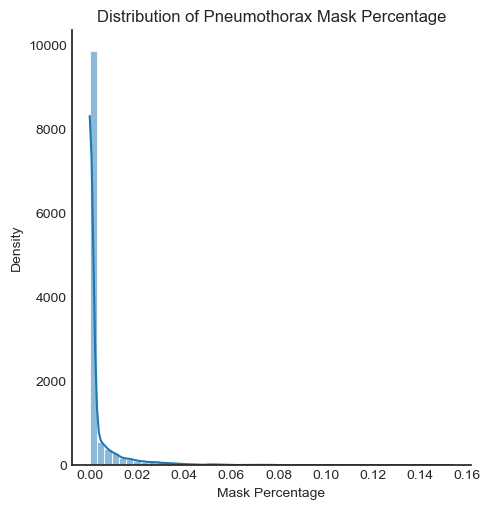

In [5]:
# Reset index to include file names as a column
mask_df.reset_index(inplace=True)

# Rename the index column for clarity (optional)
mask_df.rename(columns={'index': 'file_names'}, inplace=True)

# Visualize the distribution of mask percentages
sns.displot(mask_df['mask_percentage'], bins=50, kde=True)  # Add KDE for smoother visualization
plt.title("Distribution of Pneumothorax Mask Percentage")
plt.xlabel("Mask Percentage")
plt.ylabel("Density")
plt.show()


 Label Assignment

In [6]:
# Add a binary label: 1 if pneumothorax is present (mask percentage > 0), else 0
mask_df['labels'] = 0
mask_df.loc[mask_df['mask_percentage'] > 0, 'labels'] = 1

# Print label distribution to understand the balance of classes
print("Class Distribution in Combined Dataset:")
print(mask_df['labels'].value_counts())


Class Distribution in Combined Dataset:
labels
0    9378
1    2669
Name: count, dtype: int64


EDA Section Integration

Empty masks (no pneumothorax): 9378
Non-empty masks (pneumothorax): 2669


C:\Users\113323406\AppData\Local\Temp\ipykernel_17988\231936083.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['No Pneumothorax', 'Pneumothorax'], y=[len(empty_masks), len(non_empty_masks)], palette="Blues")


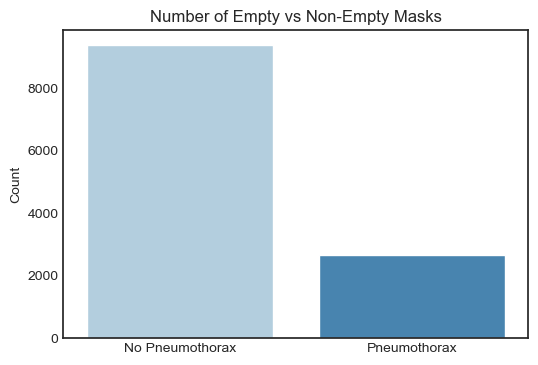

In [7]:
# Count the number of empty and non-empty masks
empty_masks = mask_df[mask_df['labels'] == 0]
non_empty_masks = mask_df[mask_df['labels'] == 1]

# Print counts of each class
print(f"Empty masks (no pneumothorax): {len(empty_masks)}")
print(f"Non-empty masks (pneumothorax): {len(non_empty_masks)}")

# Visualization of the number of masks in each class
plt.figure(figsize=(6, 4))
sns.barplot(x=['No Pneumothorax', 'Pneumothorax'], y=[len(empty_masks), len(non_empty_masks)], palette="Blues")
plt.title("Number of Empty vs Non-Empty Masks")
plt.ylabel("Count")
plt.show()


# Data Preprocessing

data generator setup (streamlined into one code and added CLAHE and minmax)

c:\ProgramData\Anaconda3\lib\site-packages\albumentations\__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Class Distribution in Combined Dataset:
labels
0    9378
1    2669
Name: count, dtype: int64

--- Split 1/5 ---
Visualizing Training Data:


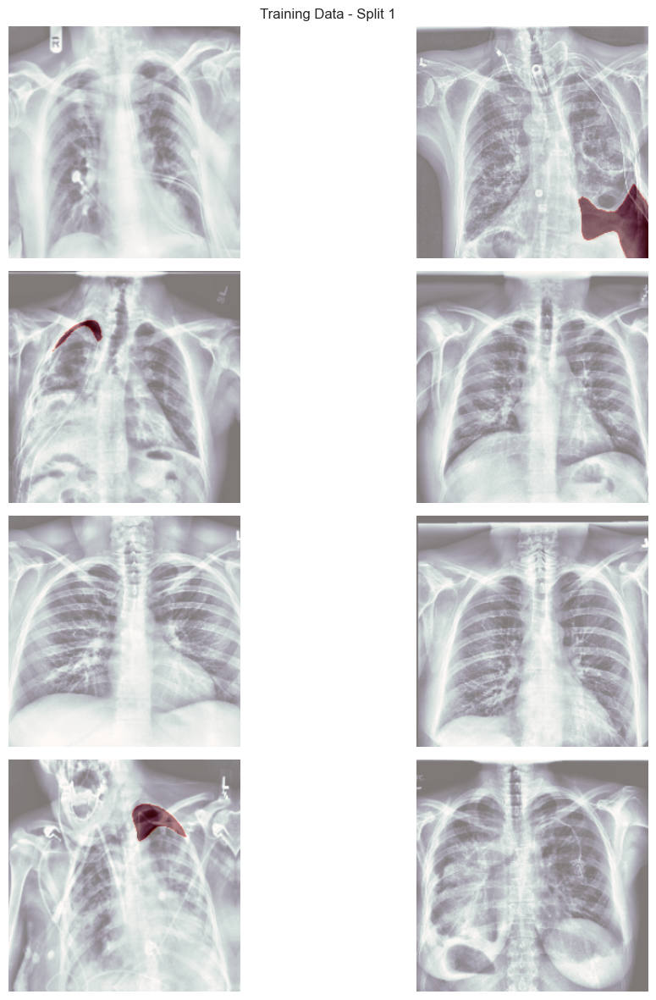

Visualizing Validation Data:


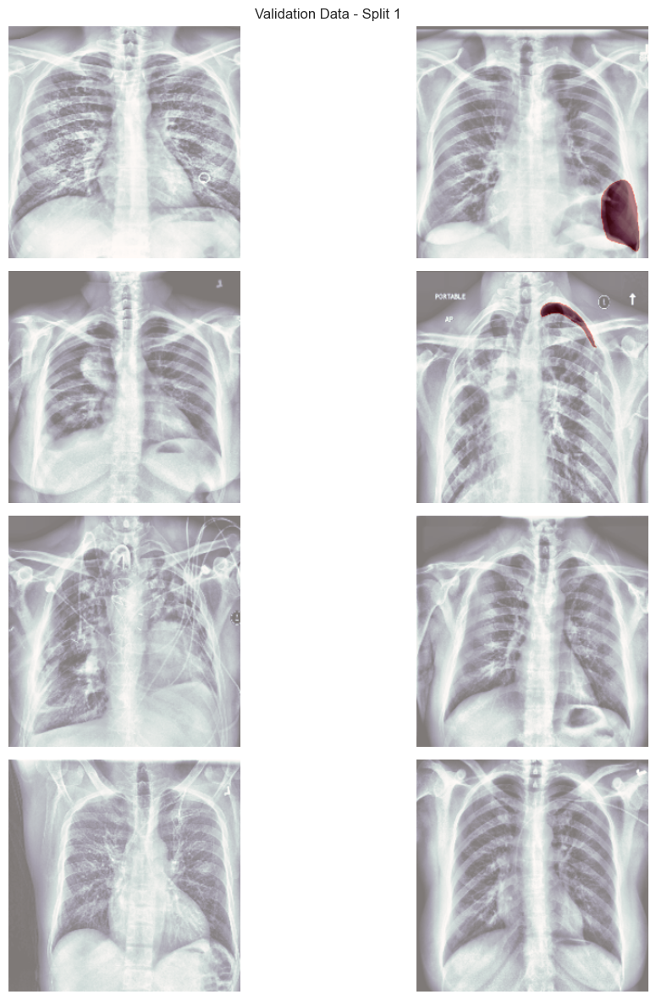


--- Split 2/5 ---
Visualizing Training Data:


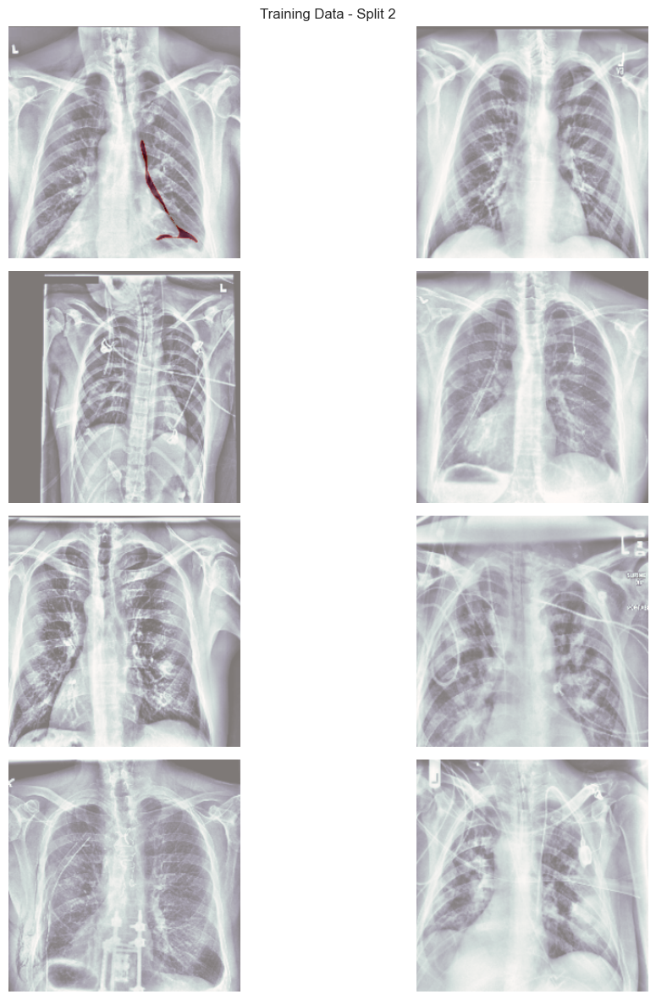

Visualizing Validation Data:


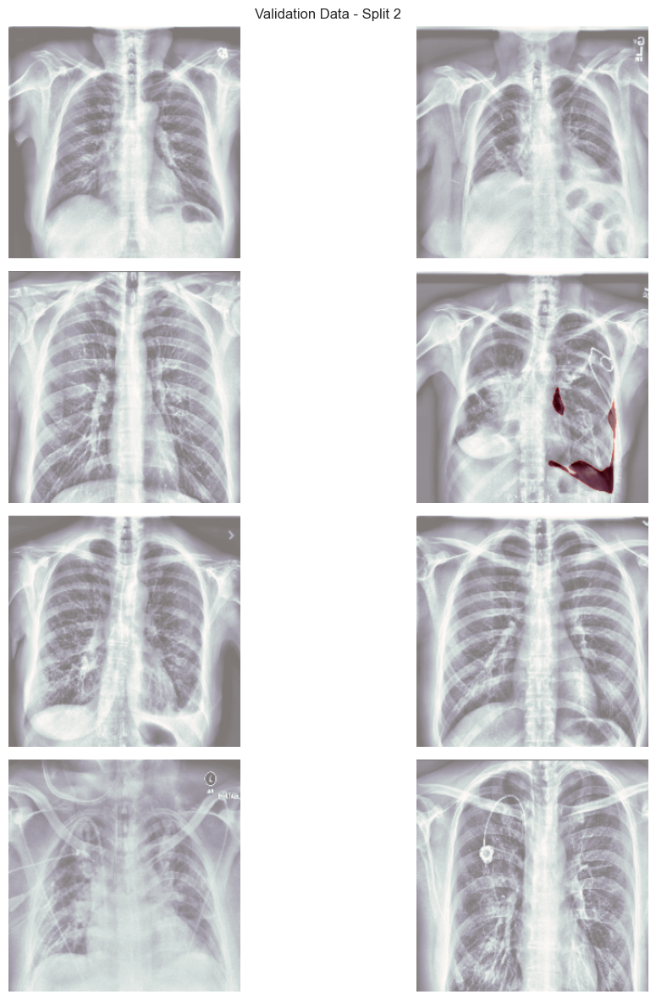


--- Split 3/5 ---
Visualizing Training Data:


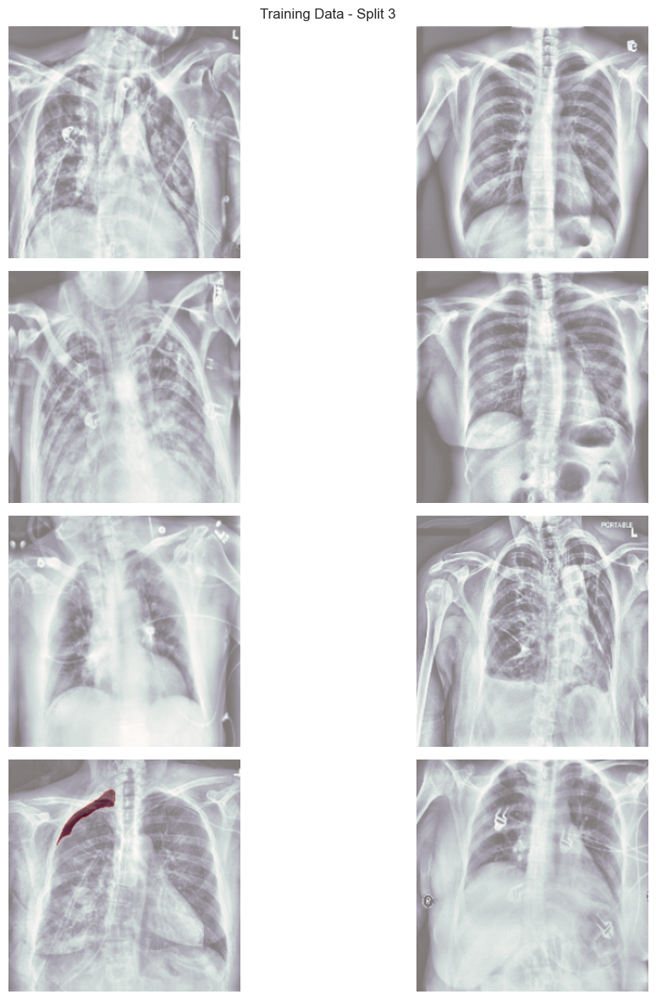

Visualizing Validation Data:


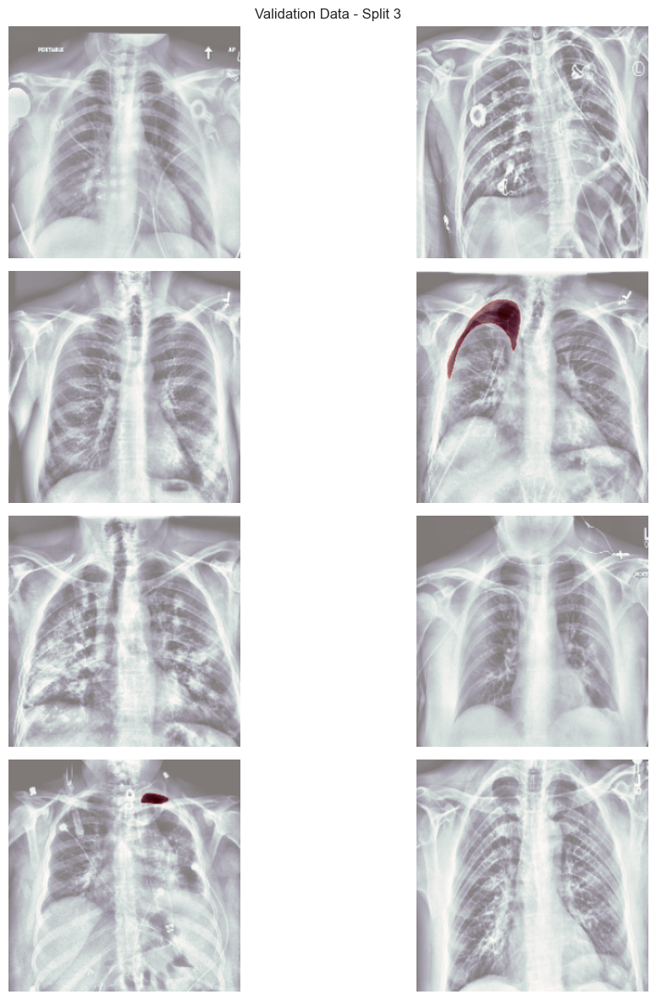


--- Split 4/5 ---
Visualizing Training Data:


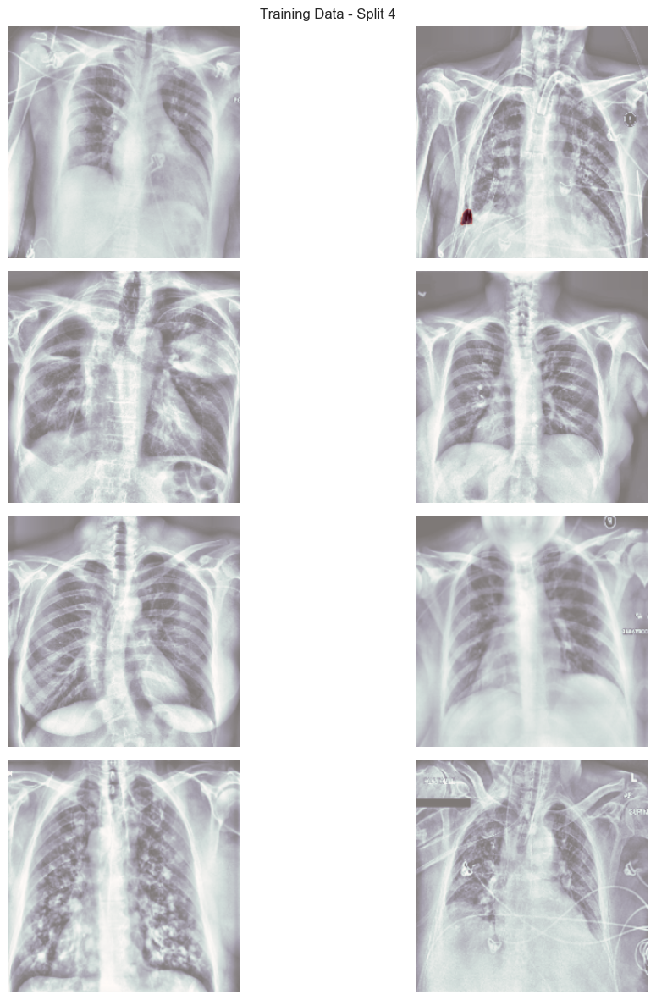

Visualizing Validation Data:


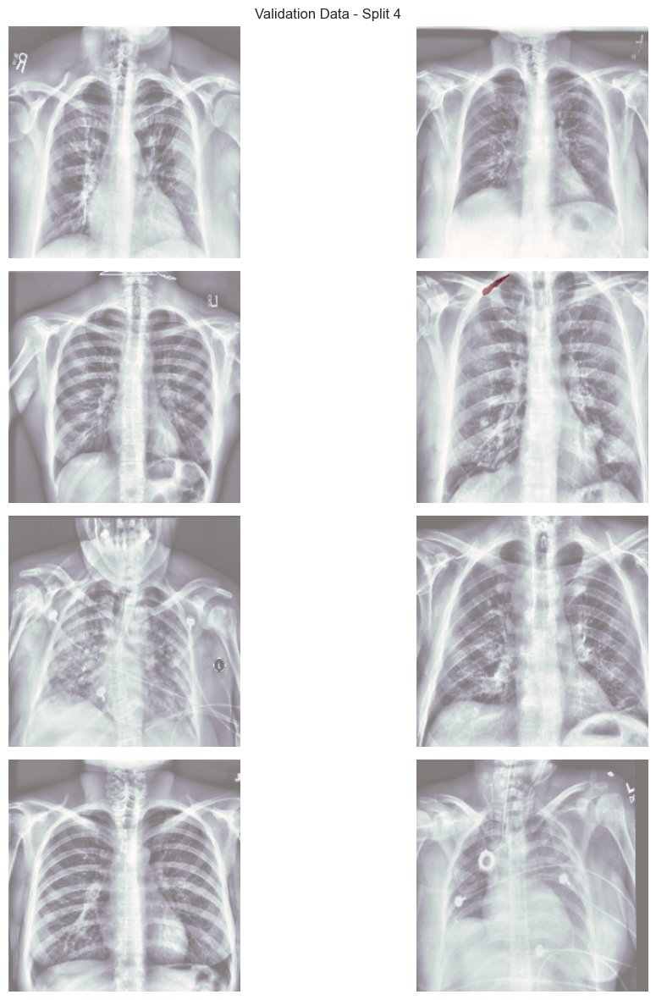


--- Split 5/5 ---
Visualizing Training Data:


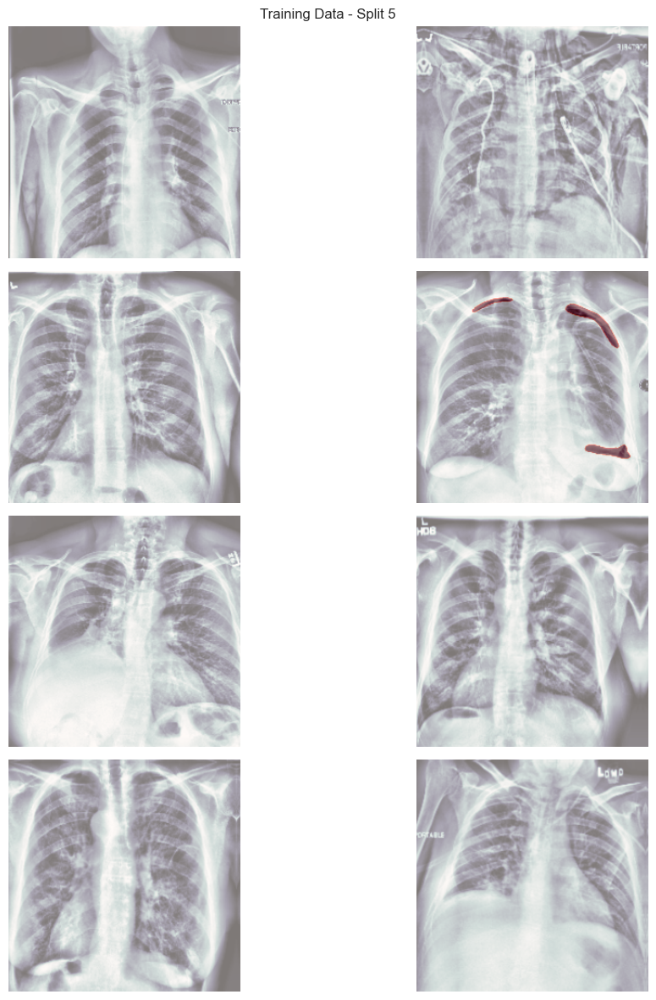

Visualizing Validation Data:


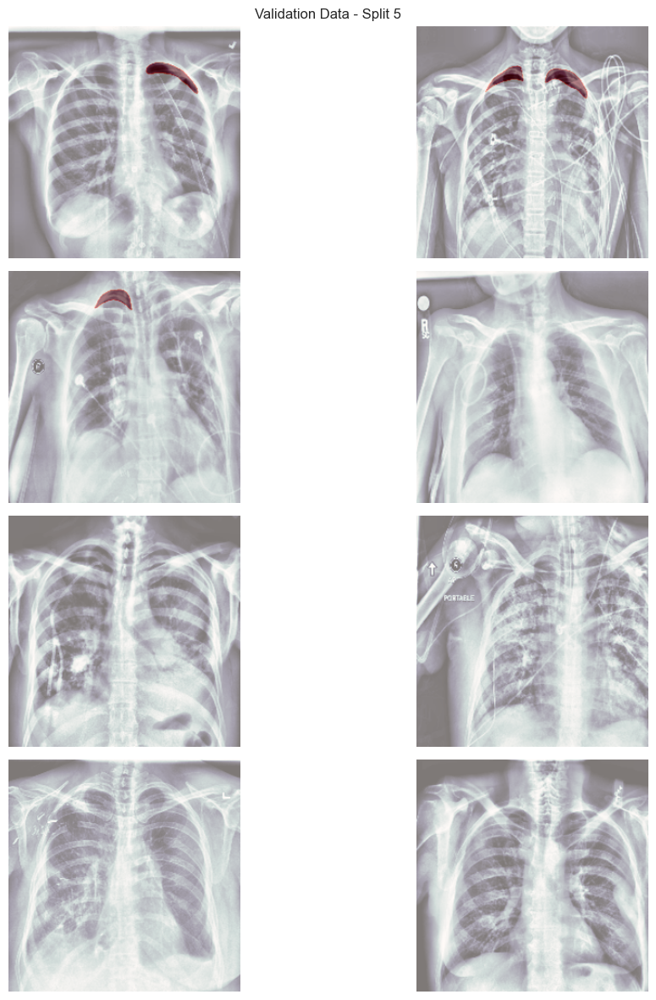

In [8]:
import numpy as np
import pandas as pd
import gc
import keras
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from albumentations import Compose, HorizontalFlip, RandomBrightnessContrast, ShiftScaleRotate
from PIL import Image
import cv2
import os
import glob
from sklearn.preprocessing import MinMaxScaler

# Set seed for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

# Combined Dataset from Above
# all_images and all_masks are already combined in the earlier sections
# mask_df is already prepared with the labels (`0` or `1`)
combined_labels = mask_df['labels'].values

print("Class Distribution in Combined Dataset:")
print(mask_df['labels'].value_counts())

# Stratified Shuffle Split
sss = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=seed)

# CLAHE and Min-Max Scaling Functions
def apply_clahe(image):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_min_max_scaling(image):
    scaler = MinMaxScaler(feature_range=(0, 1))
    image_flattened = image.flatten().reshape(-1, 1)
    scaled_image = scaler.fit_transform(image_flattened)
    return scaled_image.reshape(image.shape).astype(np.float32)

# Define Augmentations
AUGMENTATIONS_TRAIN = Compose([
    HorizontalFlip(p=0.3),
    RandomBrightnessContrast(brightness_limit=0.05, contrast_limit=0.02, p=0.2),
    ShiftScaleRotate(shift_limit=0.03, scale_limit=0.03, rotate_limit=0, p=0.3)
], p=1)

def crop_tighter_lung_area(image, padding=20):
    """
    Crop the X-ray to a tighter bounding box around the lung area with more bottom cropping.
    Args:
        image: The X-ray image (2D numpy array).
        padding: Number of pixels to pad around the estimated lung region.
    Returns:
        Cropped X-ray image.
    """
    height, width = image.shape
    # Adjust bounds to crop more from the bottom
    y_min = max(int(height * 0.08) - padding, 0)  # Keep a slight top padding
    y_max = min(int(height * 0.78) + padding, height)  # Crop more from the bottom
    x_min = max(int(width * 0.1) - padding, 0)  # Keep width padding as is
    x_max = min(int(width * 0.85) + padding, width)
    cropped_image = image[y_min:y_max, x_min:x_max]
    return cropped_image




class DataGenerator(Sequence):
    def __init__(self, image_paths, mask_paths, augmentations=None, batch_size=32, img_size=256, n_channels=3, shuffle=True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.batch_size = batch_size
        self.img_size = img_size
        self.n_channels = n_channels
        self.augment = augmentations
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_image_paths = [self.image_paths[k] for k in indexes]
        batch_mask_paths = [self.mask_paths[k] for k in indexes]
        X, y = self.data_generation(batch_image_paths, batch_mask_paths)

        if self.augment:
            augmented_images, augmented_masks = [], []
            for img, msk in zip(X, y):
                augmented = self.augment(image=img, mask=msk)
                augmented_images.append(augmented['image'])
                augmented_masks.append(augmented['mask'])
            return np.array(augmented_images), np.array(augmented_masks)

        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def data_generation(self, batch_image_paths, batch_mask_paths):
        X = np.empty((len(batch_image_paths), self.img_size, self.img_size, self.n_channels))
        y = np.empty((len(batch_mask_paths), self.img_size, self.img_size, 1))

        for i, (im_path, mask_path) in enumerate(zip(batch_image_paths, batch_mask_paths)):
            im = np.array(Image.open(im_path))
            mask = np.array(Image.open(mask_path))

            # Crop tighter lung area
            im = crop_tighter_lung_area(im)
            mask = crop_tighter_lung_area(mask)

            # Apply CLAHE and scaling
            if len(im.shape) == 2:  # Grayscale
                im = apply_clahe(im)
                im = np.repeat(im[..., np.newaxis], 3, axis=-1)
            else:  # RGB
                im = apply_clahe(cv2.cvtColor(im, cv2.COLOR_RGB2GRAY))
                im = np.repeat(im[..., np.newaxis], 3, axis=-1)

            im = apply_min_max_scaling(im)
            mask = apply_min_max_scaling(mask)

            # Resize to target size
            X[i] = cv2.resize(im, (self.img_size, self.img_size))
            y[i] = cv2.resize(mask, (self.img_size, self.img_size))[..., np.newaxis]

        return X, y


# Unified Plotting Function
def plot_data(generator, num_samples=16, title="Data Visualization"):
    images, masks = generator.__getitem__(0)
    grid_width = int(np.sqrt(num_samples))
    grid_height = int(np.ceil(num_samples / grid_width))

    fig, axs = plt.subplots(grid_height, grid_width, figsize=(12, 12))
    axs = axs.flatten()

    for i in range(num_samples):
        if i >= len(images):
            break
        img = images[i]
        mask = masks[i]
        ax = axs[i]
        ax.imshow(img[:, :, 0], cmap="bone")  # Single channel
        ax.imshow(mask.squeeze(), alpha=0.5, cmap="Reds")
        ax.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Stratified Splitting and Generator Setup
for split, (train_idx, val_idx) in enumerate(sss.split(all_images, combined_labels)):
    print(f"\n--- Split {split + 1}/5 ---")

    # Create train and validation subsets
    train_image_paths = [all_images[i] for i in train_idx]
    train_mask_paths = [all_masks[i] for i in train_idx]
    val_image_paths = [all_images[i] for i in val_idx]
    val_mask_paths = [all_masks[i] for i in val_idx]

    # Initialize generators
    training_generator = DataGenerator(train_image_paths, train_mask_paths, augmentations=AUGMENTATIONS_TRAIN, shuffle=True)
    validation_generator = DataGenerator(val_image_paths, val_mask_paths, augmentations=None, shuffle=False)

    # Visualize one batch
    print("Visualizing Training Data:")
    plot_data(training_generator, num_samples=8, title=f"Training Data - Split {split + 1}")
    print("Visualizing Validation Data:")
    plot_data(validation_generator, num_samples=8, title=f"Validation Data - Split {split + 1}")


Calculating IOU

In [9]:
def my_iou_metric(y_true, y_pred):
    """
    Compute the stepwise IoU metric using TensorFlow operations for GPU optimization,
    without adding a small constant for numerical stability.

    Args:
        y_true: Ground truth mask tensor, shape (batch_size, height, width, 1).
        y_pred: Predicted mask tensor, shape (batch_size, height, width, 1).

    Returns:
        Stepwise IoU metric averaged over the batch.
    """
    # Apply threshold to predictions
    y_pred = tf.cast(y_pred > 0.5, tf.float32)

    # Compute intersection and union
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    true_sum = tf.reduce_sum(y_true, axis=[1, 2, 3])
    pred_sum = tf.reduce_sum(y_pred, axis=[1, 2, 3])
    union = true_sum + pred_sum - intersection

    # Handle empty mask case: IoU is 1 if true and pred are both empty
    iou = tf.where(
        true_sum == 0,
        tf.cast(pred_sum == 0, tf.float32),
        intersection / union  # No epsilon added
    )

    # Stepwise adjustment for IoU > 0.5
    stepwise_iou = tf.floor(tf.maximum(0.0, (iou - 0.45) * 20)) / 10.0

    # Return averaged IoU over the batch (no .numpy())
    return tf.reduce_mean(stepwise_iou)


Defining Dice Loss + Class weights for training data

In [10]:
import tensorflow as tf
from keras.losses import binary_crossentropy
import keras.backend as K

def dice_loss(y_true, y_pred):
    """
    Calculate Dice Loss, which measures overlap between predicted and ground truth masks.
    Args:
        y_true: Ground truth mask tensor.
        y_pred: Predicted mask tensor.
    Returns:
        Dice Loss value (1 - Dice Coefficient).
    """
    smooth = 1.0
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1.0 - score

def weighted_bce_dice_loss(y_true, y_pred):
    """
    Combine Weighted Binary Cross-Entropy (BCE) Loss and Dice Loss to handle class imbalance.
    Args:
        y_true: Ground truth mask tensor.
        y_pred: Predicted mask tensor.
    Returns:
        Combined Weighted BCE and Dice Loss.
    """
    # Define class weights
    pos_weight = 3.51  # Positive class weight
    neg_weight = 1.0   # Negative class weight

    # Apply class weights to the ground truth
    weight_map = y_true * pos_weight + (1 - y_true) * neg_weight

    # Binary Cross-Entropy (BCE) Loss
    bce_loss = binary_crossentropy(y_true, y_pred)
    bce_loss = tf.reshape(bce_loss, tf.shape(weight_map))  # Align BCE loss with weight_map

    # Weighted BCE Loss
    weighted_bce_loss = bce_loss * weight_map
    weighted_bce_loss = K.mean(weighted_bce_loss)

    # Dice Loss
    smooth = 1.0
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    dice_loss_value = 1.0 - (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

    # Combine Weighted BCE and Dice Loss
    return weighted_bce_loss + dice_loss_value

In [11]:
# Calculate the number of positive (pneumothorax) and negative (no pneumothorax) samples
num_positive = mask_df['labels'].value_counts()[1]  # Number of images with pneumothorax
num_negative = mask_df['labels'].value_counts()[0]  # Number of images without pneumothorax

# Calculate weights for positive and negative classes
pos_weight = num_negative / num_positive
neg_weight = 1.0  # Typically set to 1

# Print the calculated weights
print(f"Calculated Positive Class Weight (pneumothorax): {pos_weight:.2f}")
print(f"Calculated Negative Class Weight (no pneumothorax): {neg_weight:.2f}")


Calculated Positive Class Weight (pneumothorax): 3.51
Calculated Negative Class Weight (no pneumothorax): 1.00


Useful Model Block

In [12]:
def convolution_block(x, filters, size, strides=(1, 1), padding='same', activation=True, dropout_rate=0.0):
    """
    Convolutional block with batch normalization, activation, and optional dropout.
    Args:
        x: Input tensor.
        filters: Number of filters for the convolutional layer.
        size: Kernel size for the convolutional layer.
        strides: Strides for the convolutional layer.
        padding: Padding type ('same' or 'valid').
        activation: Whether to apply activation (default: True).
        dropout_rate: Dropout rate (default: 0.0 for no dropout).
    Returns:
        Output tensor after applying convolution, batch normalization, and dropout.
    """
    x = Conv2D(filters, size, strides=strides, padding=padding)(x)
    x = BatchNormalization()(x)
    if activation:
        x = LeakyReLU(alpha=0.1)(x)
    if dropout_rate > 0.0:  # Apply dropout if rate > 0
        x = Dropout(dropout_rate)(x)
    return x


def residual_block(block_input, num_filters=16, dropout_rate=0.0):
    """
    Residual block with optional dropout.
    Args:
        block_input: Input tensor.
        num_filters: Number of filters for the convolutional layers.
        dropout_rate: Dropout rate (default: 0.0 for no dropout).
    Returns:
        Output tensor after applying residual connections with dropout.
    """
    # Shortcut path to match the output channels if necessary
    shortcut = Conv2D(num_filters, (1, 1), padding="same")(block_input)
    shortcut = BatchNormalization()(shortcut)

    # Main path
    x = convolution_block(block_input, num_filters, (3, 3), dropout_rate=dropout_rate)
    x = convolution_block(x, num_filters, (3, 3), activation=False, dropout_rate=dropout_rate)

    # Add shortcut (projected block_input) and main path
    x = Add()([x, shortcut])
    return x


Defining UEfficientNet Model

In [13]:
def UEfficientNet_with_layer_specific_dropout(input_shape=(256, 256, 3)):
    backbone = EfficientNetB4(input_shape=input_shape, weights='imagenet', include_top=False)
    input = backbone.input
    start_neurons = 16

    # Downsampling Path
    conv4 = backbone.get_layer("block6a_expand_activation").output
    conv4 = Conv2D(start_neurons * 16, (1, 1), padding="same")(conv4)
    conv4 = residual_block(conv4, start_neurons * 16, dropout_rate=0.2)  # Moderate dropout
    pool4 = MaxPooling2D((2, 2))(conv4)

    # Bottleneck
    convm = residual_block(pool4, start_neurons * 32, dropout_rate=0.4)  # High dropout
    convm = residual_block(convm, start_neurons * 32, dropout_rate=0.4)

    # Upsampling Path
    deconv4 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
    conv4 = Conv2D(start_neurons * 16, (1, 1), padding="same")(conv4)  # Match channels
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = residual_block(uconv4, start_neurons * 16, dropout_rate=0.3)  # Moderate dropout

    deconv3 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    conv3 = backbone.get_layer("block4a_expand_activation").output
    conv3 = Conv2D(start_neurons * 8, (1, 1), padding="same")(conv3)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = residual_block(uconv3, start_neurons * 8, dropout_rate=0.3)  # Moderate dropout

    deconv2 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    conv2 = backbone.get_layer("block3a_expand_activation").output
    conv2 = Conv2D(start_neurons * 4, (1, 1), padding="same")(conv2)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = residual_block(uconv2, start_neurons * 4, dropout_rate=0.2)  # Lower dropout

    deconv1 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv2)
    conv1 = backbone.get_layer("block2a_expand_activation").output
    conv1 = Conv2D(start_neurons * 2, (1, 1), padding="same")(conv1)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = residual_block(uconv1, start_neurons * 2, dropout_rate=0.2)  # Lower dropout

    uconv0 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv1)
    uconv0 = residual_block(uconv0, start_neurons * 1, dropout_rate=0.1)  # Minimal dropout

    # Output Layer
    output_layer = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(uconv0)

    model = Model(input, output_layer)
    return model


In [14]:
import keras.backend as K

# Clear previous Keras session
K.clear_session()

# Set image size
img_size = 256



In [15]:
from keras.optimizers import Adam  # Make sure to import Adam optimizer
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Add
from tensorflow.keras.models import Model

model = UEfficientNet_with_layer_specific_dropout(input_shape=(256, 256, 3))
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss=weighted_bce_dice_loss,
    metrics=[my_iou_metric]
)



Save Best Model

In [16]:
from tensorflow.keras.callbacks import ModelCheckpoint
import os

# Dynamic checkpoint filepath
checkpoint_filepath = os.path.join('C:', 'Users', '113323406', 'Documents', 'best_model.keras')

# Save the best model based on the validation IoU metric
checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,         # Dynamic path
    monitor='val_my_iou_metric',          # Metric to monitor
    mode='max',                           # Save when metric is maximized
    save_best_only=True,                  # Save only the best model
    verbose=1                             # Print saving status
)


Monitor Augmentations

In [17]:
import matplotlib.pyplot as plt

def monitor_augmentations(generator, num_batches=1):
    """
    Visualize augmented images and masks from the generator.

    Args:
        generator (DataGenerator): Data generator with augmentations applied.
        num_batches (int): Number of batches to visualize (default: 1).
    """
    for batch_idx in range(num_batches):
        images, masks = generator[batch_idx]  # Fetch the batch (simplified indexing)

        for i, (img, mask) in enumerate(zip(images, masks)):
            # Normalize image for visualization if necessary
            img = img / img.max() if img.max() > 1 else img  # Normalize to [0, 1]

            # Display the augmented image and overlay
            fig, axs = plt.subplots(1, 2, figsize=(12, 6))

            # Augmented Image
            axs[0].imshow(img[..., 0], cmap="bone")  # Assuming grayscale channel
            axs[0].set_title(f"Augmented Image {batch_idx + 1}-{i + 1}")
            axs[0].axis('off')

            # Image with Mask Overlay
            overlay = img.copy()
            overlay[..., 0] += mask.squeeze() * 0.5  # Adjust intensity for overlay
            axs[1].imshow(overlay[..., 0], cmap="bone")  # Base image
            axs[1].imshow(mask.squeeze(), alpha=0.5, cmap="Reds")  # Overlay mask
            axs[1].set_title(f"Image with Mask Overlay {batch_idx + 1}-{i + 1}")
            axs[1].axis('off')

            plt.tight_layout()
            plt.show()

        # Exit loop after visualizing one batch
        break


# Training Begins

In [18]:
def get_fold_generators(image_paths, mask_paths, train_indices, val_indices, augmentations_train, batch_size=16, img_size=256, n_channels=3):
    """
    Create training and validation data generators for a specific fold.

    Args:
        image_paths (list): List of all image file paths.
        mask_paths (list): List of all mask file paths.
        train_indices (list): Indices for training data.
        val_indices (list): Indices for validation data.
        augmentations_train: Augmentation pipeline for training data.
        batch_size (int): Batch size for data generators.
        img_size (int): Target image size.
        n_channels (int): Number of channels in the input images.

    Returns:
        training_generator, validation_generator: Data generators for the given fold.
    """
    # Split image and mask paths for train and validation
    train_images = [image_paths[i] for i in train_indices]
    train_masks = [mask_paths[i] for i in train_indices]
    val_images = [image_paths[i] for i in val_indices]
    val_masks = [mask_paths[i] for i in val_indices]

    # Training Generator with Augmentations
    training_generator = DataGenerator(
        image_paths=train_images,
        mask_paths=train_masks,
        augmentations=augmentations_train,
        batch_size=batch_size,
        img_size=img_size,
        n_channels=n_channels,
        shuffle=True
    )

    # Validation Generator (No Augmentations)
    validation_generator = DataGenerator(
        image_paths=val_images,
        mask_paths=val_masks,
        augmentations=None,  # No augmentations for validation
        batch_size=batch_size,
        img_size=img_size,
        n_channels=n_channels,
        shuffle=False
    )

    return training_generator, validation_generator


In [19]:
def visualize_generator_batch(generator, title="Batch Visualization"):
    """
    Visualizes a batch of images and masks from a data generator.

    Args:
        generator (DataGenerator): Data generator object.
        title (str): Title for the visualization.
    """
    # Get the first batch of images and masks
    images, masks = generator.__getitem__(0)  # Fetch the first batch

    # Define the grid dimensions for plotting
    max_images = min(len(images), 16)  # Limit visualization to 16 images
    grid_width = 4
    grid_height = int(np.ceil(max_images / grid_width))

    # Create a grid of subplots
    fig, axs = plt.subplots(grid_height, grid_width, figsize=(grid_width * 4, grid_height * 4))

    for i, (im, mask) in enumerate(zip(images[:max_images], masks[:max_images])):
        ax = axs[i // grid_width, i % grid_width]

        # Normalize the image for visualization if necessary
        img = im / im.max() if im.max() > 1 else im  # Normalize to [0, 1]
        ax.imshow(img[..., 0], cmap="bone")  # Assuming grayscale in the first channel
        ax.imshow(mask.squeeze(), alpha=0.5, cmap="Reds")  # Overlay mask in red

        ax.axis('off')  # Turn off axis
        ax.set_title(f"Image {i + 1}")

    # Adjust layout
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


Total images: 12047
Total masks: 12047
Label distribution: 0    9378
1    2669
Name: count, dtype: int64

--- Fold 1/5 ---
Fold 1 Class Weights: {0: 0.6422953878965609, 1: 2.2569086651053865}
Epoch 1/80
603/603 [==============================] - 246s 377ms/step - loss: 1.5616 - my_iou_metric: 0.0000e+00 - val_loss: 1.3856 - val_my_iou_metric: 0.0000e+00
Epoch 2/80
603/603 [==============================] - 223s 370ms/step - loss: 1.2721 - my_iou_metric: 0.1723 - val_loss: 1.2002 - val_my_iou_metric: 0.8390
Epoch 3/80
603/603 [==============================] - 224s 371ms/step - loss: 1.1088 - my_iou_metric: 0.4055 - val_loss: 1.1085 - val_my_iou_metric: 0.8540
Epoch 4/80
603/603 [==============================] - 224s 371ms/step - loss: 0.9979 - my_iou_metric: 0.4575 - val_loss: 1.0434 - val_my_iou_metric: 0.8093
Epoch 5/80
603/603 [==============================] - 222s 368ms/step - loss: 0.8713 - my_iou_metric: 0.5379 - val_loss: 68.2863 - val_my_iou_metric: 0.0000e+00
Epoch 6/80
603/

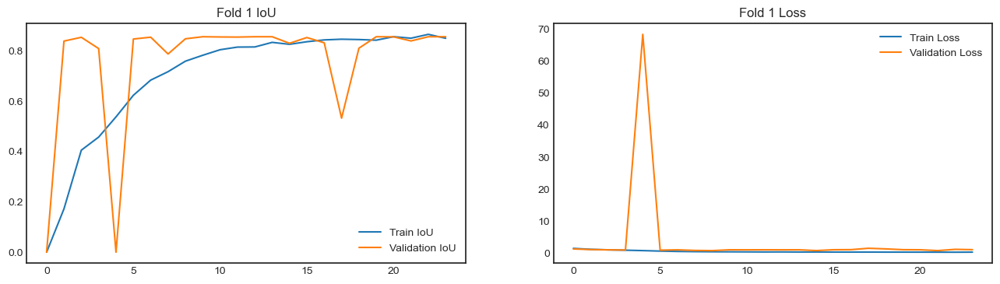

Completed Fold 1

--- Fold 2/5 ---
Fold 2 Class Weights: {0: 0.6422953878965609, 1: 2.2569086651053865}
Epoch 1/80
603/603 [==============================] - 239s 375ms/step - loss: 1.5869 - my_iou_metric: 2.9022e-04 - val_loss: 1.4450 - val_my_iou_metric: 2.0695e-04
Epoch 2/80
603/603 [==============================] - 224s 371ms/step - loss: 1.3282 - my_iou_metric: 0.2017 - val_loss: 1.2377 - val_my_iou_metric: 0.8566
Epoch 3/80
603/603 [==============================] - 224s 371ms/step - loss: 1.1465 - my_iou_metric: 0.4240 - val_loss: 1.1230 - val_my_iou_metric: 0.8566
Epoch 4/80
603/603 [==============================] - 224s 371ms/step - loss: 1.0293 - my_iou_metric: 0.4690 - val_loss: 1.0633 - val_my_iou_metric: 0.8164
Epoch 5/80
603/603 [==============================] - 224s 371ms/step - loss: 0.9139 - my_iou_metric: 0.5257 - val_loss: 1.0125 - val_my_iou_metric: 0.6375
Epoch 6/80
603/603 [==============================] - 224s 371ms/step - loss: 0.7533 - my_iou_metric: 0.6121

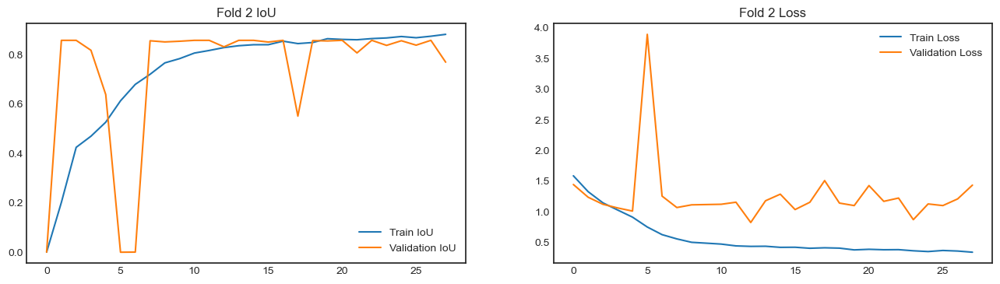

Completed Fold 2

--- Fold 3/5 ---
Fold 3 Class Weights: {0: 0.6423620367901893, 1: 2.2560861423220975}
Epoch 1/80
603/603 [==============================] - 242s 381ms/step - loss: 1.5849 - my_iou_metric: 5.8043e-04 - val_loss: 1.4531 - val_my_iou_metric: 0.8534
Epoch 2/80
603/603 [==============================] - 226s 375ms/step - loss: 1.3211 - my_iou_metric: 0.1489 - val_loss: 1.2505 - val_my_iou_metric: 0.5370
Epoch 3/80
603/603 [==============================] - 225s 373ms/step - loss: 1.1394 - my_iou_metric: 0.4551 - val_loss: 1.1322 - val_my_iou_metric: 0.8566
Epoch 4/80
603/603 [==============================] - 225s 374ms/step - loss: 1.0195 - my_iou_metric: 0.5073 - val_loss: 1.0702 - val_my_iou_metric: 0.8557
Epoch 5/80
603/603 [==============================] - 225s 373ms/step - loss: 0.8972 - my_iou_metric: 0.5555 - val_loss: 1.0615 - val_my_iou_metric: 0.8566
Epoch 6/80
603/603 [==============================] - 225s 372ms/step - loss: 0.7376 - my_iou_metric: 0.6322 - v

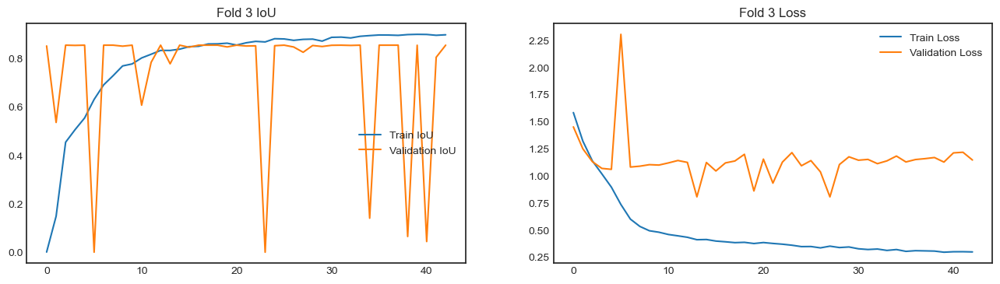

Completed Fold 3

--- Fold 4/5 ---
Fold 4 Class Weights: {0: 0.6422764227642277, 1: 2.257142857142857}
Epoch 1/80
603/603 [==============================] - 239s 374ms/step - loss: 1.5862 - my_iou_metric: 4.0423e-04 - val_loss: 1.4761 - val_my_iou_metric: 0.6897
Epoch 2/80
603/603 [==============================] - 223s 370ms/step - loss: 1.3219 - my_iou_metric: 0.2154 - val_loss: 1.2098 - val_my_iou_metric: 0.8562
Epoch 3/80
603/603 [==============================] - 223s 370ms/step - loss: 1.1390 - my_iou_metric: 0.4609 - val_loss: 1.1011 - val_my_iou_metric: 0.6776
Epoch 4/80
603/603 [==============================] - 223s 369ms/step - loss: 1.0203 - my_iou_metric: 0.5180 - val_loss: 1.0664 - val_my_iou_metric: 0.8543
Epoch 5/80
603/603 [==============================] - 223s 369ms/step - loss: 0.8981 - my_iou_metric: 0.5588 - val_loss: 1.0414 - val_my_iou_metric: 0.7825
Epoch 6/80
603/603 [==============================] - 223s 369ms/step - loss: 0.7348 - my_iou_metric: 0.6414 - va

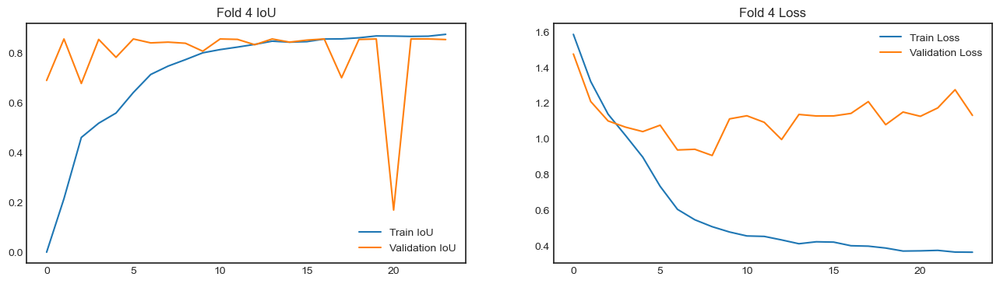

Completed Fold 4

--- Fold 5/5 ---
Fold 5 Class Weights: {0: 0.6422764227642277, 1: 2.257142857142857}
Epoch 1/80
603/603 [==============================] - 238s 373ms/step - loss: 1.5555 - my_iou_metric: 8.0846e-04 - val_loss: 1.3914 - val_my_iou_metric: 9.1060e-04
Epoch 2/80
603/603 [==============================] - 223s 369ms/step - loss: 1.2765 - my_iou_metric: 0.2566 - val_loss: 1.1754 - val_my_iou_metric: 0.7180
Epoch 3/80
603/603 [==============================] - 223s 369ms/step - loss: 1.1091 - my_iou_metric: 0.5022 - val_loss: 1.1277 - val_my_iou_metric: 0.7818
Epoch 4/80
603/603 [==============================] - 223s 369ms/step - loss: 0.9961 - my_iou_metric: 0.5278 - val_loss: 1.0602 - val_my_iou_metric: 0.8395
Epoch 5/80
603/603 [==============================] - 222s 368ms/step - loss: 0.8683 - my_iou_metric: 0.5967 - val_loss: 1.0674 - val_my_iou_metric: 0.8558
Epoch 6/80
603/603 [==============================] - 223s 369ms/step - loss: 0.7013 - my_iou_metric: 0.6557 

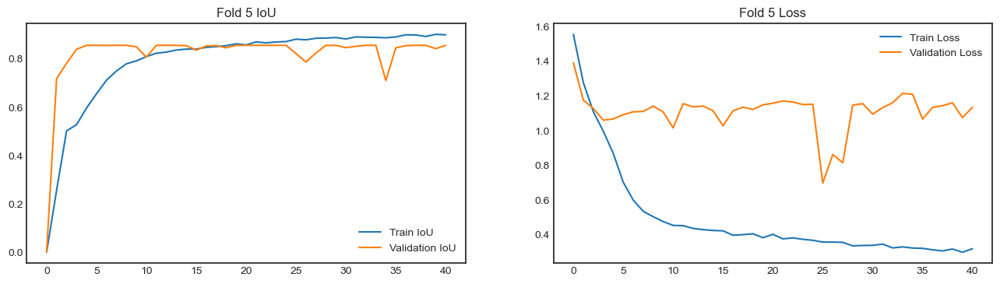

Completed Fold 5


In [20]:
# Use combined dataset for cross-validation
image_paths = all_images
mask_paths = all_masks

# Assign labels based on mask presence (non-empty masks = pneumothorax)
labels = []
for mask_path in all_masks:
    mask = np.array(Image.open(mask_path))  # Load the mask
    labels.append(1 if np.sum(mask) > 0 else 0)  # Label as 1 if mask is non-empty, else 0

# Verify dataset
print(f"Total images: {len(all_images)}")
print(f"Total masks: {len(all_masks)}")
print(f"Label distribution: {pd.Series(labels).value_counts()}")

from sklearn.model_selection import StratifiedKFold
from keras.callbacks import ModelCheckpoint, Callback
import tensorflow.keras.backend as K
import tensorflow as tf
import os
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping

class MetricSanitizerCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs:
            sanitized_logs = {}
            for key, value in logs.items():
                if isinstance(value, tf.Tensor):
                    sanitized_logs[key] = value.numpy()  # Convert Tensor to numpy
                elif isinstance(value, np.ndarray):
                    sanitized_logs[key] = float(value)  # Convert numpy array to float
                else:
                    sanitized_logs[key] = value  # Use as-is if already a Python-native type
            print(f"Epoch {epoch + 1}, Logs: {sanitized_logs}")
        else:
            print(f"Epoch {epoch + 1}, Logs: None")

# Initialize StratifiedKFold for 5 folds
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define the directory for saving model checkpoints
checkpoint_dir = './checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist

from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Cross-validation loop
for fold, (train_idx, val_idx) in enumerate(skf.split(image_paths, labels)):
    print(f"\n--- Fold {fold + 1}/5 ---")

    # Generate training and validation data for this fold
    training_generator, validation_generator = get_fold_generators(
        image_paths=image_paths,
        mask_paths=mask_paths,
        train_indices=train_idx,
        val_indices=val_idx,
        augmentations_train=AUGMENTATIONS_TRAIN,
        batch_size=16
    )

    # Calculate class weights for the training data in this fold
    train_labels = [labels[i] for i in train_idx]
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(labels),
        y=train_labels
    )
    class_weights = {i: weight for i, weight in enumerate(class_weights)}
    print(f"Fold {fold + 1} Class Weights: {class_weights}")

    # Define model
    model = UEfficientNet_with_layer_specific_dropout(input_shape=(256, 256, 3))
    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss=weighted_bce_dice_loss,
        metrics=[my_iou_metric]  # Ensure this matches the actual function you are using
    )


    # Define EarlyStopping callback
    early_stopping_callback = EarlyStopping(
        monitor='val_loss',  # Metric to monitor
        patience=15,         # Number of epochs to wait before stopping
        restore_best_weights=True,  # Restore the best weights after stopping
        verbose=1
    )

    # Train the model
    history = model.fit(
        training_generator,
        validation_data=validation_generator,
        epochs=80,
        callbacks=[MetricSanitizerCallback(), early_stopping_callback],

        verbose=1
    )

    # Plot training history
    plt.figure(figsize=(16, 4))

    # IoU Metric Plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['my_iou_metric'], label='Train IoU')
    plt.plot(history.history['val_my_iou_metric'], label='Validation IoU')
    plt.legend()
    plt.title(f"Fold {fold + 1} IoU")

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Fold {fold + 1} Loss")

    plt.show()

    # Clear Keras session to free memory
    K.clear_session()

    print(f"Completed Fold {fold + 1}")

Averaging K Folds

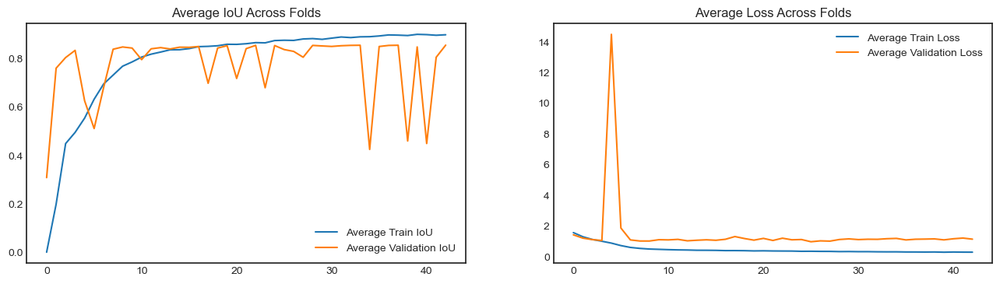


--- Final Cross-Validation Results ---
Average Train IoU: 0.8996
Average Validation IoU: 0.8566
Average Train Loss: 0.3000
Average Validation Loss: 1.1475


In [24]:
import numpy as np
from keras.utils import pad_sequences
import matplotlib.pyplot as plt


# Define the fold metrics dictionary with all the training results
fold_metrics = {
    'Fold 1': {
    'train_iou_history': [
        0.0000, 0.1723, 0.4055, 0.4575, 0.5379, 0.6236, 0.6839,
        0.7175, 0.7592, 0.7827, 0.8047, 0.8152, 0.8157, 0.8339,
        0.8262, 0.8365, 0.8437, 0.8465, 0.8451, 0.8426, 0.8565,
        0.8505, 0.8658, 0.8502
    ],
    'val_iou_history': [
        0.0000, 0.8390, 0.8540, 0.8093, 0.0000, 0.8472, 0.8545,
        0.7878, 0.8481, 0.8563, 0.8554, 0.8550, 0.8563, 0.8563,
        0.8302, 0.8531, 0.8322, 0.5327, 0.8108, 0.8563, 0.8559,
        0.8396, 0.8563, 0.8563
    ],
    'train_loss_history': [
        1.5616, 1.2721, 1.1088, 0.9979, 0.8713, 0.7206, 0.6093,
        0.5522, 0.5098, 0.4957, 0.4746, 0.4479, 0.4619, 0.4319,
        0.4354, 0.4208, 0.4129, 0.4159, 0.3972, 0.4006, 0.3935,
        0.3821, 0.3716, 0.3945
    ],
    'val_loss_history': [
        1.3856, 1.2002, 1.1085, 1.0434, 68.2863, 1.0083, 1.1076,
        0.9238, 0.8641, 1.1239, 1.1125, 1.1249, 1.1135, 1.1222,
        0.8734, 1.1378, 1.1657, 1.5951, 1.4036, 1.1557, 1.1232,
        0.8665, 1.2587, 1.1619
    ],
    },
    'Fold 2': {
    'train_iou_history': [
        0.0003, 0.2017, 0.4240, 0.4690, 0.5257, 0.6121, 0.6786,
        0.7193, 0.7655, 0.7827, 0.8052, 0.8156, 0.8273, 0.8349,
        0.8389, 0.8390, 0.8532, 0.8434, 0.8477, 0.8632, 0.8604,
        0.8589, 0.8637, 0.8663, 0.8721, 0.8671, 0.8732, 0.8808
    ],
    'val_iou_history': [
        0.0002, 0.8566, 0.8566, 0.8164, 0.6375, 0.0000, 0.0005,
        0.8549, 0.8502, 0.8530, 0.8566, 0.8566, 0.8304, 0.8566,
        0.8566, 0.8497, 0.8566, 0.5502, 0.8557, 0.8542, 0.8566,
        0.8058, 0.8566, 0.8362, 0.8550, 0.8371, 0.8566, 0.7683
    ],
    'train_loss_history': [
        1.5869, 1.3282, 1.1465, 1.0293, 0.9139, 0.7533, 0.6290,
        0.5599, 0.5042, 0.4900, 0.4754, 0.4459, 0.4380, 0.4401,
        0.4223, 0.4239, 0.4073, 0.4151, 0.4094, 0.3808, 0.3904,
        0.3832, 0.3848, 0.3663, 0.3538, 0.3713, 0.3622, 0.3431
    ],
    'val_loss_history': [
        1.4450, 1.2377, 1.1230, 1.0633, 1.0125, 3.8889, 1.2563,
        1.0701, 1.1141, 1.1187, 1.1232, 1.1568, 0.8269, 1.1804,
        1.2877, 1.0371, 1.1562, 1.5088, 1.1426, 1.1020, 1.4280,
        1.1709, 1.2246, 0.8729, 1.1286, 1.1021, 1.2107, 1.4349
    ],
    },
    'Fold 3': {
    'train_iou_history': [
        0.0006, 0.1489, 0.4551, 0.5073, 0.5555, 0.6322, 0.6923,
        0.7304, 0.7708, 0.7790, 0.8038, 0.8191, 0.8350, 0.8348,
        0.8401, 0.8505, 0.8520, 0.8616, 0.8621, 0.8648, 0.8570,
        0.8665, 0.8724, 0.8700, 0.8834, 0.8824, 0.8767, 0.8807,
        0.8817, 0.8734, 0.8891, 0.8900, 0.8865, 0.8934, 0.8963,
        0.8988, 0.8985, 0.8973, 0.9004, 0.9014, 0.9010, 0.8975,
        0.8996
    ],
    'val_iou_history': [
        0.8534, 0.5370, 0.8566, 0.8557, 0.8566, 0.0000, 0.8566,
        0.8566, 0.8525, 0.8566, 0.6083, 0.7856, 0.8566, 0.7795,
        0.8566, 0.8481, 0.8566, 0.8566, 0.8566, 0.8494, 0.8566,
        0.8531, 0.8539, 0.0000, 0.8544, 0.8566, 0.8491, 0.8273,
        0.8553, 0.8512, 0.8562, 0.8566, 0.8556, 0.8566, 0.1408,
        0.8566, 0.8566, 0.8566, 0.0650, 0.8563, 0.0442, 0.8065,
        0.8566
    ],
    'train_loss_history': [
        1.5849, 1.3211, 1.1394, 1.0195, 0.8972, 0.7376, 0.6026,
        0.5350, 0.4952, 0.4817, 0.4608, 0.4483, 0.4351, 0.4126,
        0.4145, 0.4002, 0.3934, 0.3856, 0.3884, 0.3775, 0.3865,
        0.3781, 0.3713, 0.3618, 0.3490, 0.3498, 0.3374, 0.3531,
        0.3403, 0.3457, 0.3289, 0.3222, 0.3267, 0.3138, 0.3219,
        0.3053, 0.3114, 0.3097, 0.3078, 0.2974, 0.3017, 0.3020,
        0.3000
    ],
    'val_loss_history': [
        1.4531, 1.2505, 1.1322, 1.0702, 1.0615, 2.3064, 1.0827,
        1.0907, 1.1047, 1.1010, 1.1208, 1.1430, 1.1255, 0.8079,
        1.1246, 1.0465, 1.1208, 1.1386, 1.2001, 0.8622, 1.1559,
        0.9345, 1.1283, 1.2159, 1.0946, 1.1421, 1.0382, 0.8075,
        1.1059, 1.1770, 1.1458, 1.1532, 1.1140, 1.1396, 1.1840,
        1.1297, 1.1518, 1.1600, 1.1705, 1.1285, 1.2133, 1.2191,
        1.1475
    ],
    },
    'Fold 4': {
    'train_iou_history': [
        0.0004, 0.2154, 0.4609, 0.5180, 0.5588, 0.6414, 0.7137,
        0.7472, 0.7731, 0.8005, 0.8135, 0.8236, 0.8344, 0.8473,
        0.8433, 0.8455, 0.8559, 0.8564, 0.8609, 0.8683, 0.8677,
        0.8664, 0.8673, 0.8747
    ],
    'val_iou_history': [
        0.6897, 0.8562, 0.6776, 0.8543, 0.7825, 0.8562, 0.8404,
        0.8435, 0.8390, 0.8071, 0.8562, 0.8545, 0.8330, 0.8562,
        0.8434, 0.8516, 0.8562, 0.7006, 0.8541, 0.8562, 0.1696,
        0.8562, 0.8562, 0.8539
    ],
    'train_loss_history': [
        1.5862, 1.3219, 1.1390, 1.0203, 0.8981, 0.7348, 0.6057,
        0.5472, 0.5084, 0.4787, 0.4566, 0.4540, 0.4343, 0.4129,
        0.4239, 0.4220, 0.4018, 0.3994, 0.3888, 0.3719, 0.3731,
        0.3758, 0.3663, 0.3655
    ],
    'val_loss_history': [
        1.4761, 1.2098, 1.1011, 1.0664, 1.0414, 1.0771, 0.9384,
        0.9422, 0.9074, 1.1125, 1.1300, 1.0933, 0.9968, 1.1373,
        1.1288, 1.1292, 1.1432, 1.2093, 1.0801, 1.1509, 1.1270,
        1.1739, 1.2760, 1.1321
    ],
    },
    'Fold 5': {
    'train_iou_history': [
        0.0008, 0.2566, 0.5022, 0.5278, 0.5967, 0.6557, 0.7115, 
        0.7499, 0.7795, 0.7916, 0.8094, 0.8232, 0.8279, 0.8363,
        0.8402, 0.8403, 0.8475, 0.8503, 0.8547, 0.8621, 0.8576,
        0.8701, 0.8660, 0.8696, 0.8713, 0.8812, 0.8787, 0.8850,
        0.8858, 0.8879, 0.8821, 0.8907, 0.8893, 0.8887, 0.8869,
        0.8904, 0.8993, 0.8987, 0.8924, 0.9012, 0.8993
    ],
    'val_iou_history': [
        0.0009, 0.7180, 0.7818, 0.8395, 0.8558, 0.8558, 0.8554,
        0.8558, 0.8558, 0.8494, 0.8070, 0.8558, 0.8558, 0.8558,
        0.8544, 0.8359, 0.8533, 0.8544, 0.8458, 0.8558, 0.8558,
        0.8558, 0.8558, 0.8558, 0.8558, 0.8214, 0.7868, 0.8243,
        0.8558, 0.8554, 0.8464, 0.8518, 0.8558, 0.8558, 0.7102,
        0.8455, 0.8544, 0.8558, 0.8558, 0.8421, 0.8558
    ],
    'train_loss_history': [
        1.5555, 1.2765, 1.1091, 0.9961, 0.8683, 0.7013, 0.5987,
        0.5341, 0.5030, 0.4748, 0.4527, 0.4512, 0.4351, 0.4284,
        0.4235, 0.4212, 0.3960, 0.3993, 0.4045, 0.3817, 0.4012,
        0.3751, 0.3807, 0.3724, 0.3666, 0.3565, 0.3565, 0.3548,
        0.3346, 0.3368, 0.3374, 0.3447, 0.3228, 0.3287, 0.3220,
        0.3202, 0.3119, 0.3053, 0.3163, 0.2979, 0.3177
    ],
    'val_loss_history': [
        1.3914, 1.1754, 1.1277, 1.0602, 1.0674, 1.0917, 1.1083,
        1.1106, 1.1412, 1.1077, 1.0156, 1.1554, 1.1370, 1.1418,
        1.1145, 1.0278, 1.1139, 1.1350, 1.1219, 1.1483, 1.1580,
        1.1711, 1.1648, 1.1502, 1.1521, 0.6970, 0.8618, 0.8147,
        1.1466, 1.1554, 1.0952, 1.1321, 1.1607, 1.2148, 1.2096,
        1.0665, 1.1336, 1.1437, 1.1604, 1.0750, 1.1339
    ]},
}

import numpy as np
import matplotlib.pyplot as plt

# Replace pad_sequences with manual NaN-padding for better averaging
def pad_and_average(histories, max_length):
    padded = np.full((len(histories), max_length), np.nan)
    for i, history in enumerate(histories):
        padded[i, :len(history)] = history
    return np.nanmean(padded, axis=0)

# Extract and compute maximum history length
max_length = max(max(len(fold['train_iou_history']) for fold in fold_metrics.values()),
                 max(len(fold['val_iou_history']) for fold in fold_metrics.values()))

# Pad histories and compute averages
average_train_iou = pad_and_average([fold['train_iou_history'] for fold in fold_metrics.values()], max_length)
average_val_iou = pad_and_average([fold['val_iou_history'] for fold in fold_metrics.values()], max_length)
average_train_loss = pad_and_average([fold['train_loss_history'] for fold in fold_metrics.values()], max_length)
average_val_loss = pad_and_average([fold['val_loss_history'] for fold in fold_metrics.values()], max_length)

# Plot averaged metrics
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.plot(average_train_iou, label='Average Train IoU')
plt.plot(average_val_iou, label='Average Validation IoU')
plt.legend()
plt.title('Average IoU Across Folds')

plt.subplot(1, 2, 2)
plt.plot(average_train_loss, label='Average Train Loss')
plt.plot(average_val_loss, label='Average Validation Loss')
plt.legend()
plt.title('Average Loss Across Folds')
plt.show()

# Final averaged results
print("\n--- Final Cross-Validation Results ---")
print(f"Average Train IoU: {average_train_iou[-1]:.4f}")
print(f"Average Validation IoU: {average_val_iou[-1]:.4f}")
print(f"Average Train Loss: {average_train_loss[-1]:.4f}")
print(f"Average Validation Loss: {average_val_loss[-1]:.4f}")


Validation Predictions and Sanity Check

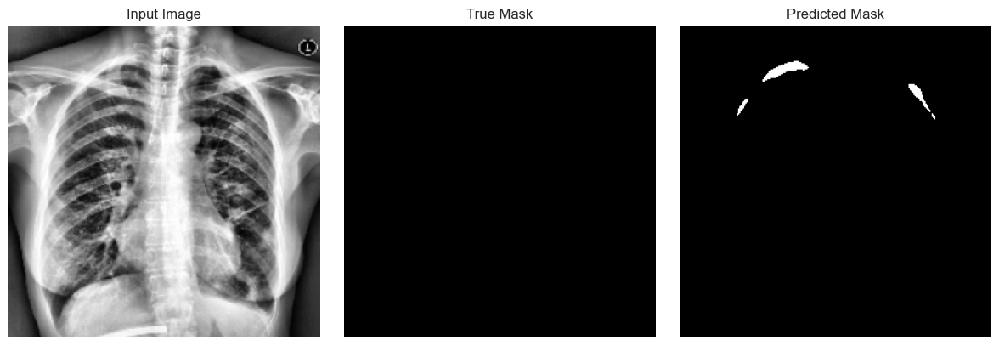

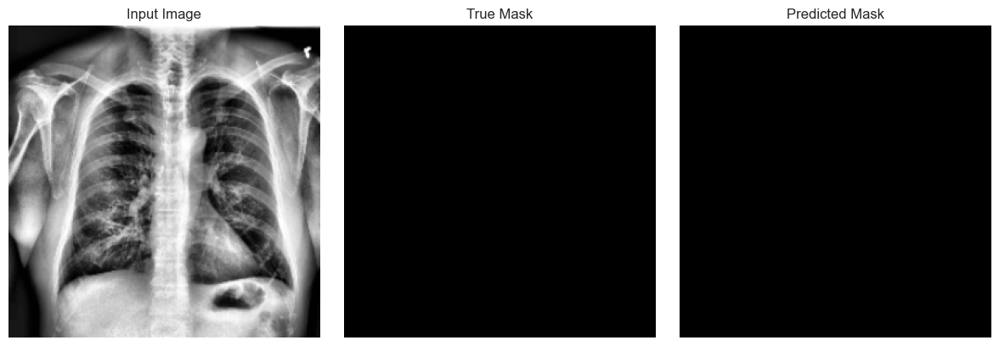

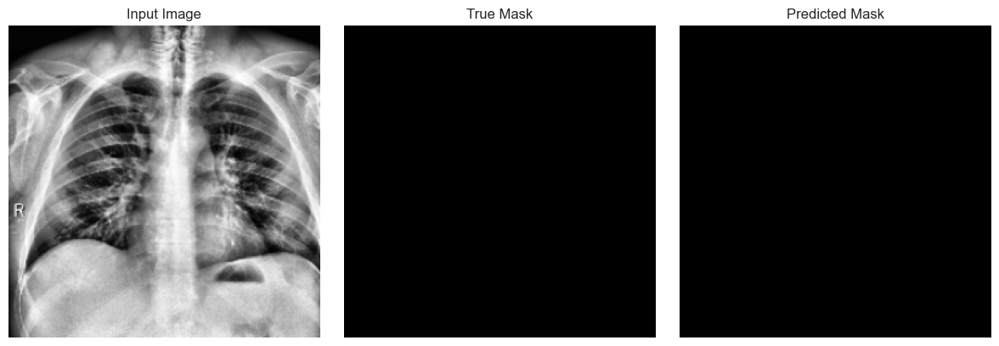

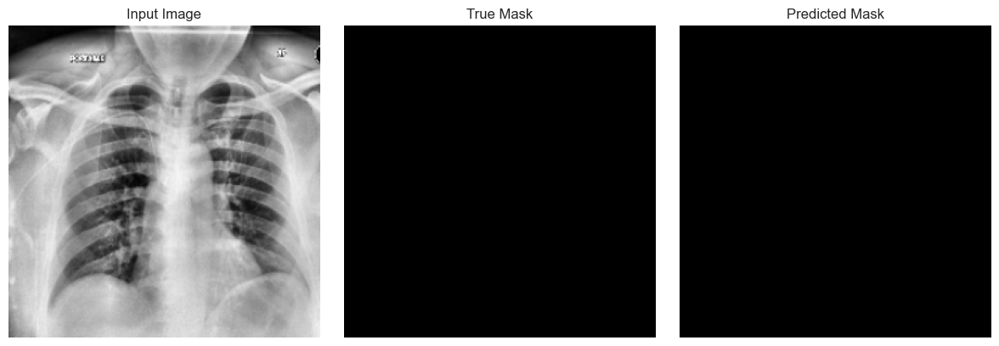

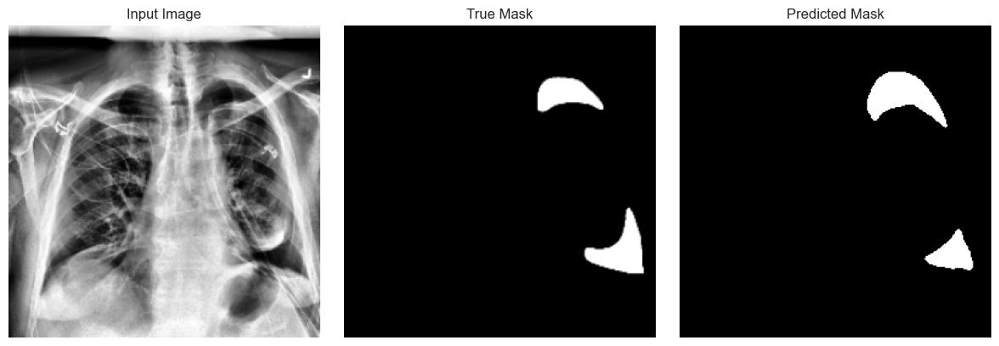

In [33]:
import matplotlib.pyplot as plt
import numpy as np
import random

def plot_validation_predictions(model, generator, num_samples=5, random_seed=None):
    """
    Visualize randomly selected input images, ground truth masks, and predicted masks from the validation set.
    Args:
        model: trained model
        generator: validation data generator
        num_samples: number of random samples to visualize
        random_seed: seed for reproducible random selection
    """
    # Set random seed if provided
    if random_seed is not None:
        random.seed(random_seed)
    
    # Get the total number of batches in the generator
    total_batches = len(generator)
    
    # Generate random batch indices
    batch_indices = random.sample(range(total_batches), min(num_samples, total_batches))
    
    for batch_idx in batch_indices:
        # Get the batch
        images, masks = generator[batch_idx]
        
        # For each batch, randomly select one sample
        if images.shape[0] > 1:  # If batch size > 1
            sample_idx = random.randint(0, images.shape[0] - 1)
            image = images[sample_idx]
            true_mask = masks[sample_idx]
        else:  # If batch size == 1
            image = images[0]
            true_mask = masks[0]
            
        # Make prediction
        predicted_mask = model.predict(image[np.newaxis, ...], verbose=0)[0] > 0.5

        # Plot results
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 3, 1)
        plt.title("Input Image")
        plt.imshow(image[..., 0], cmap="gray")
        plt.axis('off')
        
        plt.subplot(1, 3, 2)
        plt.title("True Mask")
        plt.imshow(true_mask[..., 0], cmap="gray")
        plt.axis('off')
        
        plt.subplot(1, 3, 3)
        plt.title("Predicted Mask")
        plt.imshow(predicted_mask[..., 0], cmap="gray")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Example usage:
plot_validation_predictions(model, validation_generator, num_samples=5)


Prediction Results (Single Batch):
Correct predictions: 10 out of 16
Accuracy: 62.50%

Generating prediction grid...


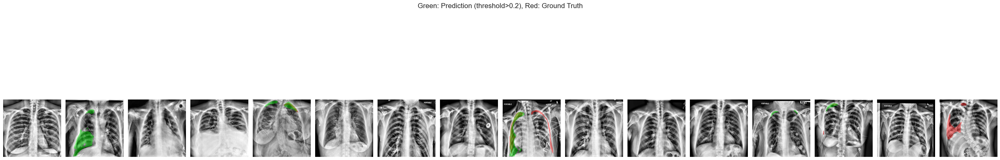

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

def calculate_prediction_scores(model, generator, threshold=0.5):
    """
    Calculate how many predictions are correct for a single batch
    """
    # Get one batch
    images, masks = next(iter(generator))
    
    # Get predictions
    preds = model.predict(images, verbose=0)
    binary_preds = (preds > threshold).astype(np.float32)
    
    # Compare predictions with true masks
    correct_predictions = np.all(binary_preds == masks, axis=(1,2,3))
    total_correct = np.sum(correct_predictions)
    total_samples = len(images)
    
    accuracy = (total_correct / total_samples) * 100
    return total_correct, total_samples, accuracy, images, masks, binary_preds

def plot_prediction_grid(images, masks, predictions, num_images=16):
    """
    Plot grid of predictions for one batch in a single row
    """
    # Create single row plot
    fig, axs = plt.subplots(1, num_images, figsize=(32, 8))
    
    threshold = 0.2  # Adjusted threshold for visualization
    
    for i in range(num_images):
        # Plot original image
        axs[i].imshow(images[i, ..., 0], cmap='gray')
        
        # Get masks
        pred = predictions[i].squeeze()
        true_mask = masks[i].squeeze()
        
        # Create colored overlays with transparency
        red_overlay = np.zeros((*pred.shape, 4))
        red_overlay[true_mask > 0] = [1, 0, 0, 0.4]
        
        green_overlay = np.zeros((*pred.shape, 4))
        green_overlay[pred > threshold] = [0, 1, 0, 0.4]
        
        # Apply overlays
        axs[i].imshow(red_overlay)
        axs[i].imshow(green_overlay)
        
        axs[i].axis('off')
    
    plt.suptitle(f"Green: Prediction (threshold>{threshold}), Red: Ground Truth", fontsize=16)
    plt.tight_layout()
    plt.show()

# Example usage:
threshold = 0.5

# Calculate predictions and scores for one batch
correct, total, accuracy, images, masks, predictions = calculate_prediction_scores(
    model, validation_generator, threshold
)

# Print results
print(f"\nPrediction Results (Single Batch):")
print(f"Correct predictions: {correct} out of {total}")
print(f"Accuracy: {accuracy:.2f}%")

# Plot grid of predictions
print("\nGenerating prediction grid...")
plot_prediction_grid(images, masks, predictions)

Test-Time Augmentation (TTA) on Validation Set


TTA Prediction Results (Random Batch):
Correct predictions: 12 out of 16
Accuracy: 75.00%


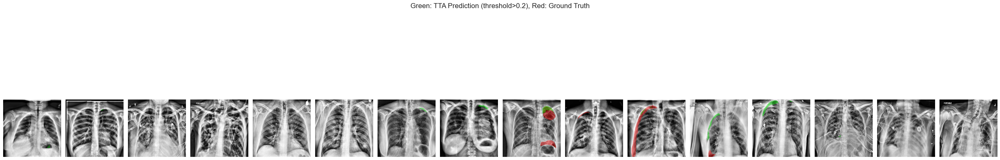

In [72]:
import random
import numpy as np
import matplotlib.pyplot as plt

def tta_predictions(model, image, img_size=256):
    """
    Apply Test-Time Augmentation (TTA) for a single image.
    """
    augmentations = [
        lambda x: x,                  # original
        lambda x: np.flipud(x),       # flip up-down
        lambda x: np.fliplr(x),       # flip left-right
        lambda x: np.rot90(x, k=1),   # 90 degree rotation
        lambda x: np.rot90(x, k=2),   # 180 degree rotation
        lambda x: np.rot90(x, k=3)    # 270 degree rotation
    ]
    
    reverse_augmentations = [
        lambda x: x,                  # original
        lambda x: np.flipud(x),       # flip up-down
        lambda x: np.fliplr(x),       # flip left-right
        lambda x: np.rot90(x, k=-1),  # -90 degree rotation
        lambda x: np.rot90(x, k=-2),  # -180 degree rotation
        lambda x: np.rot90(x, k=-3)   # -270 degree rotation
    ]
    
    predictions = []
    for aug, reverse_aug in zip(augmentations, reverse_augmentations):
        aug_image = aug(image)
        pred = model.predict(aug_image[np.newaxis, ...], verbose=0)[0]
        pred = reverse_aug(pred)
        predictions.append(pred)
    
    return np.mean(predictions, axis=0)

def calculate_tta_metrics(model, generator, threshold=0.5, random_seed=None):
    """
    Calculate metrics with TTA on random samples from validation set.
    """
    if random_seed is not None:
        random.seed(random_seed)
    
    num_batches = len(generator)
    batch_idx = random.randint(0, num_batches-1)
    images, masks = generator[batch_idx]
    
    raw_predictions = []
    for image in images:
        pred = tta_predictions(model, image)
        raw_predictions.append(pred)
    
    raw_predictions = np.array(raw_predictions)
    binary_preds = (raw_predictions > threshold).astype(np.float32)
    
    correct_predictions = np.all(binary_preds == masks, axis=(1,2,3))
    total_correct = np.sum(correct_predictions)
    total_samples = len(masks)
    accuracy = (total_correct / total_samples) * 100
    
    return total_correct, total_samples, accuracy, images, masks, raw_predictions

def plot_tta_predictions(images, masks, predictions, num_images=16, random_seed=None):
    """
    Plot grid of TTA predictions using random samples with adjusted threshold
    """
    if random_seed is not None:
        random.seed(random_seed)
    
    total_images = len(images)
    indices = random.sample(range(total_images), min(num_images, total_images))
    
    fig, axs = plt.subplots(1, len(indices), figsize=(32, 8))
    
    threshold = 0.2
    
    for i, idx in enumerate(indices):
        axs[i].imshow(images[idx, ..., 0], cmap='gray')
        
        pred = predictions[idx].squeeze()
        true_mask = masks[idx].squeeze()
        
        red_overlay = np.zeros((*pred.shape, 4))
        red_overlay[true_mask > 0] = [1, 0, 0, 0.4]
        
        green_overlay = np.zeros((*pred.shape, 4))
        green_overlay[pred > threshold] = [0, 1, 0, 0.4]
        
        axs[i].imshow(red_overlay)
        axs[i].imshow(green_overlay)
        axs[i].axis('off')
    
    plt.suptitle(f"Green: TTA Prediction (threshold>{threshold}), Red: Ground Truth", fontsize=16)
    plt.tight_layout()
    plt.show()

# Example usage
threshold = 0.5
random_seed = 42

correct, total, accuracy, images, masks, predictions = calculate_tta_metrics(
    model, validation_generator, threshold, random_seed
)

print(f"\nTTA Prediction Results (Random Batch):")
print(f"Correct predictions: {correct} out of {total}")
print(f"Accuracy: {accuracy:.2f}%")

plot_tta_predictions(images, masks, predictions, random_seed=random_seed)